<a href="https://colab.research.google.com/github/edersonbadeca/fase6/blob/main/Ederson_Badeca_rm560204_pbl_fase6.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

### Importação das imagens diretamente do drive

In [ ]:
from google.colab import drive
drive.mount ('/content/drive', force_remount=True)



Mounted at /content/drive


## Clonar e carregar o yolo 5 a partir do github

In [ ]:
!git clone https://github.com/ultralytics/yolov5.git

Cloning into 'yolov5'...
remote: Enumerating objects: 17410, done.
remote: Counting objects: 100% (84/84), done.
remote: Compressing objects: 100% (62/62), done.
remote: Total 17410 (delta 63), reused 22 (delta 22), pack-reused 17326 (from 3)
Receiving objects: 100% (17410/17410), 16.29 MiB | 29.53 MiB/s, done.
Resolving deltas: 100% (11928/11928), done.


## Vamos verificar a estrutura de arquivos da lib

In [ ]:
! ls yolov5/
# Agora vamos rodar o pip install aqui para instalar as dependencias do nosso projeto

benchmarks.py	 data	     LICENSE	     README.zh-CN.md   tutorial.ipynb
CITATION.cff	 detect.py   models	     requirements.txt  utils
classify	 export.py   pyproject.toml  segment	       val.py
CONTRIBUTING.md  hubconf.py  README.md	     train.py


# Instalando dependencias do projeto

In [ ]:
pip install -r yolov5/requirements.txt

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 122.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 91.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 59.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 6.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 13.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 5.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 72.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 981.3/981.3 kB 49.2 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninstal

# Preparando os labels
No nesse caso, os mapas estão zipados, e como eu quero reutilizar esse modelo para outros projetos, vamos preparar os dados para que eu fique na estrutura de diretorios desejada.

* Extrair os arquivos zip
* Criar os diretorios


In [ ]:
# Listando os arquivos
!ls "/content/drive/My Drive/faculdade/fase6/entrega1-fase6/labels/"
# Vamos usar o pacote tree para visualizar os arquivos dentro dos dirs

train  train.cache  trainning  val  val.cache  validation


In [ ]:
# Instalando o pacote na VM
!apt-get install tree

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
The following NEW packages will be installed:
  tree
0 upgraded, 1 newly installed, 0 to remove and 34 not upgraded.
Need to get 47.9 kB of archives.
After this operation, 116 kB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu jammy/universe amd64 tree amd64 2.0.2-1 [47.9 kB]
Fetched 47.9 kB in 1s (86.4 kB/s)
Selecting previously unselected package tree.
(Reading database ... 126332 files and directories currently installed.)
Preparing to unpack .../tree_2.0.2-1_amd64.deb ...
Unpacking tree (2.0.2-1) ...
Setting up tree (2.0.2-1) ...
Processing triggers for man-db (2.10.2-1) ...


In [ ]:
# agora podemos visualizar os arquivos também
!tree "/content/drive/My Drive/faculdade/fase6/entrega1-fase6/labels/"


/content/drive/My Drive/faculdade/fase6/entrega1-fase6/labels/
├── train
│   ├── bicycles_0_gdec23ad81b6d8b4bc33a937746a5acfcba1946d290a6d242fd30d02959a8336d2061ff9975ead934f751e830996ea04915c9308b535240ab1d7c720b4c8b46fd_640.txt
│   ├── bicycles_10_ga6ecb60fde0cd555874d530822527a4c831222885c1ea33b0a3bc893dcda481cff6b2a7de72a7c05572fef93c3790a536c05c63fb880a4037c3dd7375b6c0dc1_640.txt
│   ├── bicycles_11_g4a8330b8e3d22c47b9c2dc6369bb0c5fc06bf1d840a3c1d2606f0a942ef56706417196799ffdbc85ba8ce13ea702ba3821efe6a838a888604f8037dbc5be3050_640.txt
│   ├── bicycles_12_gc54cf683e90d72f2121a5a80fef79339aa1e4f2c0b78155b4031b38c09251792706a4196fb7475136eb22a677d1eaaa5f793a345938736a18baf53373fddb749_640.txt
│   ├── bicycles_13_g1d064b45a26931e0eb036414f3cd78bacb03ee0d845e2c935edacc21f9116137124dacefe5957b836e3b95dbdea7cd65_640.txt
│   ├── bicycles_14_ga786548d952dbf528d043ca4cbc5bd72151277a381f4c32fd513e4bd5329ec83e9026eee121649093d077a09d8f8241ed34873b200bcc3fcc14aca41c45604a8_640.txt
│   ├── bicy

# Extrair os arquivos
Precisamos extrair os arquivos, e esse processo pode ser demorado dependendo do tamanho do dir

para isso vamos usar coroutines do python para melhorar a performance do processo

# Procedure para extração com courotines
agora com as deps instaladas na vm, vamos criar o procedure para extração.

In [ ]:
import asyncio
import zipfile
import os

async def extract_zip_async(zip_path, extract_to):
    """
    Extrai o conteúdo de um arquivo ZIP de forma assíncrona.

    Args:
        zip_path (str): Caminho para o arquivo ZIP.
        extract_to (str): Diretório onde extrair o conteúdo.
    """
    def extract():
        os.makedirs(extract_to, exist_ok=True)
        with zipfile.ZipFile(zip_path, 'r') as zip_ref:
            zip_ref.extractall(extract_to)

    try:
        await asyncio.to_thread(extract)
        print(f"Arquivo ZIP '{zip_path}' extraído para '{extract_to}'")
    except Exception as e:
        print(f"Erro ao extrair o arquivo ZIP '{zip_path}': {e}")


In [ ]:
# Usando a função para extrair os arquivos de treino
!rm -rf "/content/drive/My Drive/faculdade/fase6/entrega1-fase6/labels/train/"
zip_file_path = "/content/drive/My Drive/faculdade/fase6/entrega1-fase6/labels/trainning/make-sense-annotations-trainning.zip"
extract_directory = "/content/drive/My Drive/faculdade/fase6/entrega1-fase6/labels/train/"
await extract_zip_async(zip_file_path, extract_directory)

# Extrair as anotações de validação:
zip_file_path = "/content/drive/MyDrive/faculdade/fase6/entrega1-fase6/labels/validation/make-sense-annotation-validation.zip"
extract_directory = "/content/drive/My Drive/faculdade/fase6/entrega1-fase6/labels/val/"
await extract_zip_async(zip_file_path, extract_directory)





Arquivo ZIP '/content/drive/My Drive/faculdade/fase6/entrega1-fase6/labels/trainning/make-sense-annotations-trainning.zip' extraído para '/content/drive/My Drive/faculdade/fase6/entrega1-fase6/labels/train/'
Arquivo ZIP '/content/drive/MyDrive/faculdade/fase6/entrega1-fase6/labels/validation/make-sense-annotation-validation.zip' extraído para '/content/drive/My Drive/faculdade/fase6/entrega1-fase6/labels/val/'


In [ ]:
# Validando os arquivos
!ls -lstra "/content/drive/My Drive/faculdade/fase6/entrega1-fase6/labels/"

total 44
 4 drwx------ 2 root root  4096 Apr 18 15:30 trainning
 4 drwx------ 2 root root  4096 Apr 18 15:30 validation
25 -rw------- 1 root root 25397 Apr 18 17:38 train.cache
 3 -rw------- 1 root root  2916 Apr 18 17:38 val.cache
 4 drwx------ 2 root root  4096 Apr 21 13:47 train
 4 drwx------ 2 root root  4096 Apr 21 13:47 val


## Vamos começar o treinamento com o YOLO

In [ ]:
# copia o arquivo de config para o yolov5 data e o yaml para o drive
! cat /content/drive/MyDrive/faculdade/fase6/entrega1-fase6/objects.yaml
#!cp /content/objects.yaml /content/drive/MyDrive/faculdade/fase6/entrega1-fase6/objects.yaml
!cp /content/drive/MyDrive/faculdade/fase6/entrega1-fase6/objects.yaml yolov5/data/


train: /content/drive/MyDrive/faculdade/fase6/entrega1-fase6/images/train
val: /content/drive/MyDrive/faculdade/fase6/entrega1-fase6/images/val

nc: 2
names: ["Bicicleta", "Carro"]


In [ ]:
# Vamos resetar as exp
!rm -rf /content/yolov5/runs/train

In [ ]:
# Executa o yolo com os dados de treinamentos vamos usar 30 epocas
!python yolov5/train.py --data objects.yaml --weights yolov5s.pt --img 640 --epochs 30

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
wandb: WARNING ⚠️ wandb is deprecated and will be removed in a future release. See supported integrations at https://github.com/ultralytics/yolov5#integrations.
2025-04-21 13:47:42.745843: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1745243262.969163    2036 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1745243263.033134    2036 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS wh

# Analise do treinamento com 30 epocas

## Matriz de confusão:

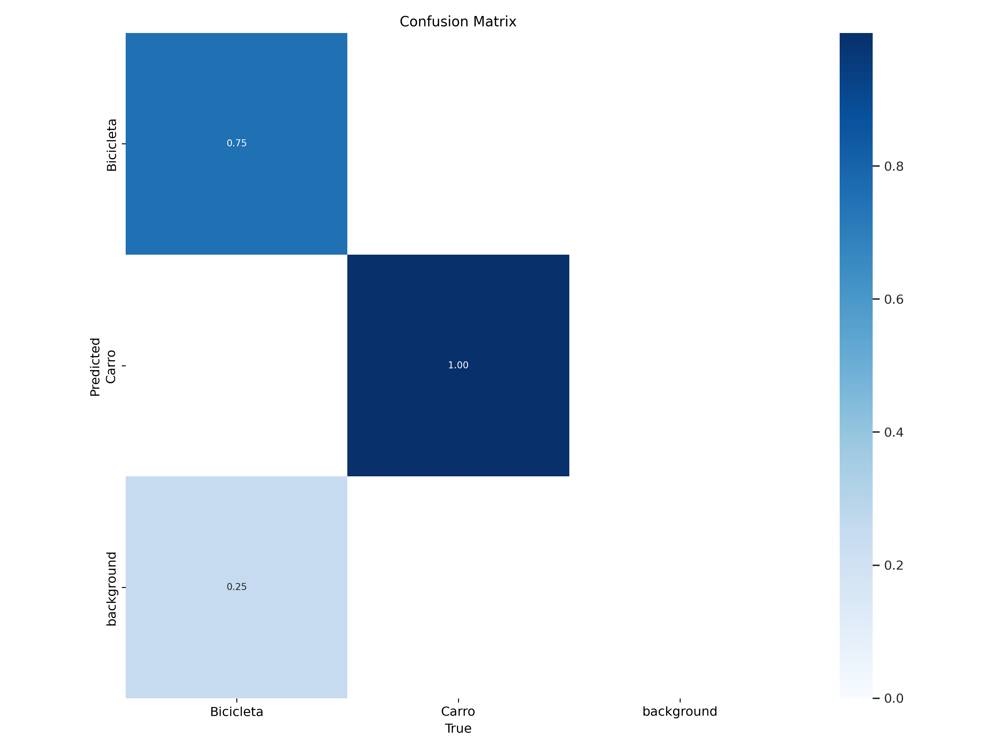

In [ ]:
from IPython.display import Image
Image(filename='/content/yolov5/runs/train/exp/confusion_matrix.png', width=600)

**Desempenho Geral**: O modelo tem um desempenho muito bom na detecção de carros, com 100% de acurácia. No entanto, o desempenho na detecção de bicicletas é um pouco menor (75%).



# Analise geral do resultado com 30 epocas:

Olhando os graficos gerados pelo yolo, temos as seguintes informações:

Visão Geral dos Gráficos

A imagem apresenta 10 gráficos dispostos em duas linhas:

**Linha Superior (Treinamento):**
* train/box_loss: Perda da caixa delimitadora durante o treinamento.
* train/obj_loss: Perda de objetividade (confiança) durante o treinamento.
* train/cls_loss: Perda de classificação durante o treinamento.
* metrics/precision: Precisão durante o treinamento.
* metrics/recall: Recall durante o treinamento.

**Linha Inferior (Validação):**
* val/box_loss: Perda da caixa delimitadora durante a validação.
* val/obj_loss: Perda de objetividade durante a validação.
* val/cls_loss: Perda de classificação durante a validação.
* metrics/mAP_0.5: Valor médio da precisão (mAP) com um limiar de IoU
* (Interseção sobre União) de 0.5 durante a validação.
* metrics/mAP_0.5:0.95: mAP com IoU variando de 0.5 a 0.95 durante a validação.

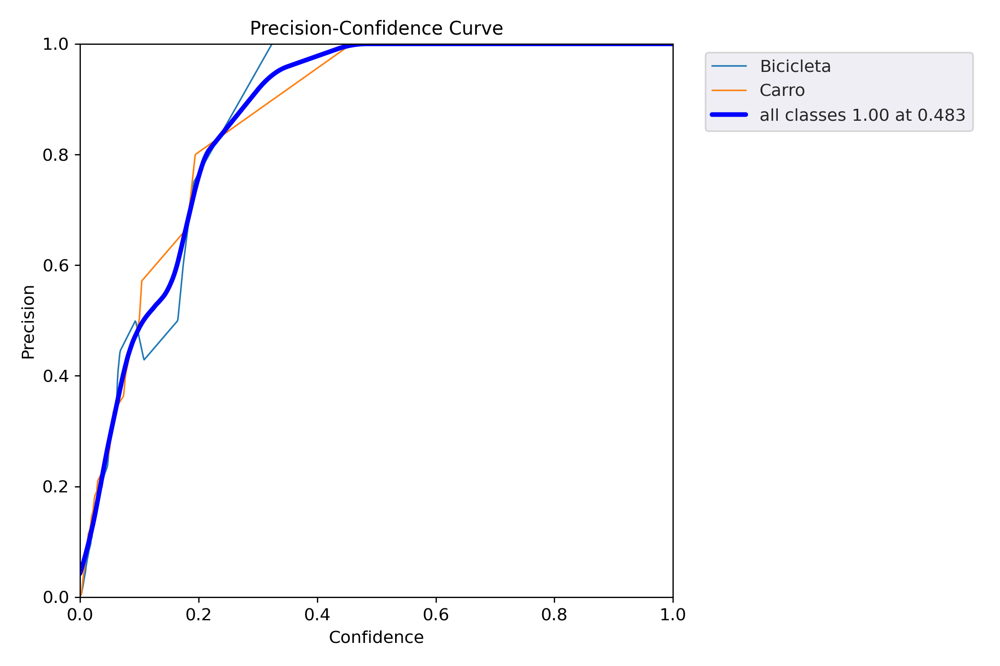

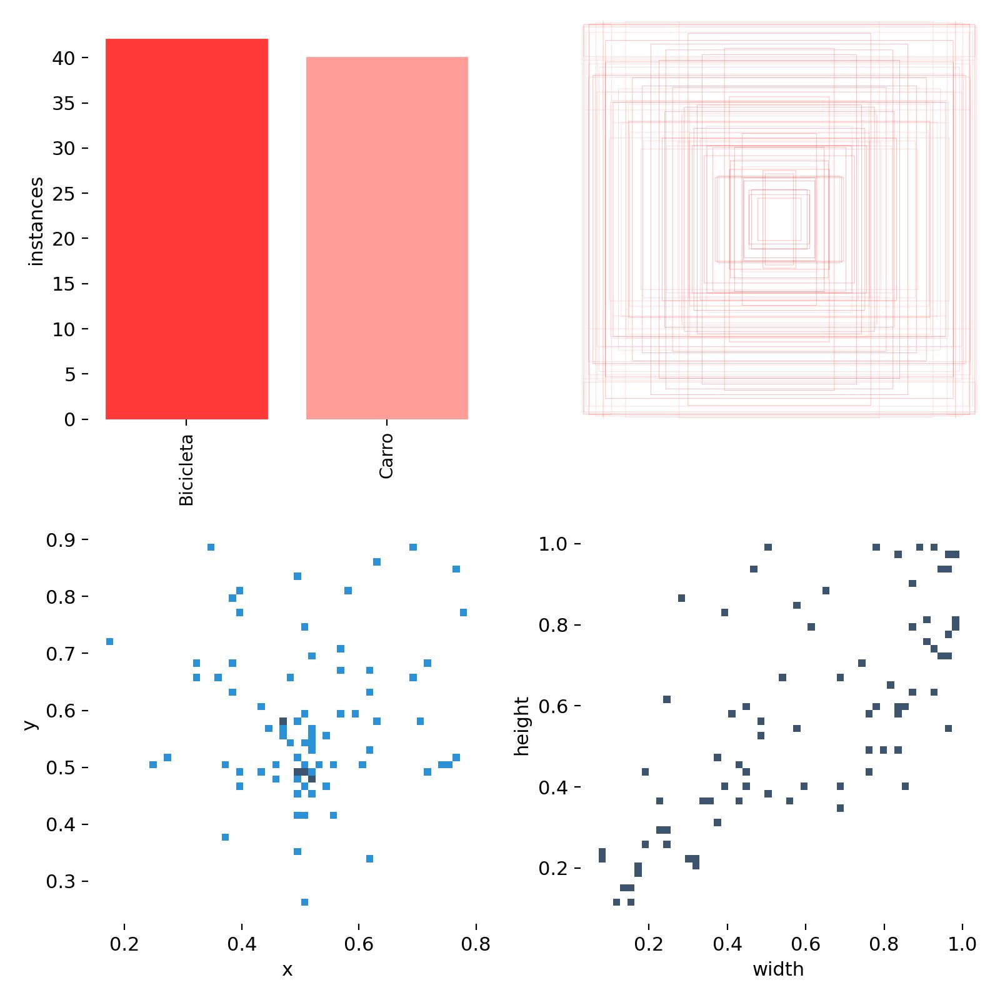

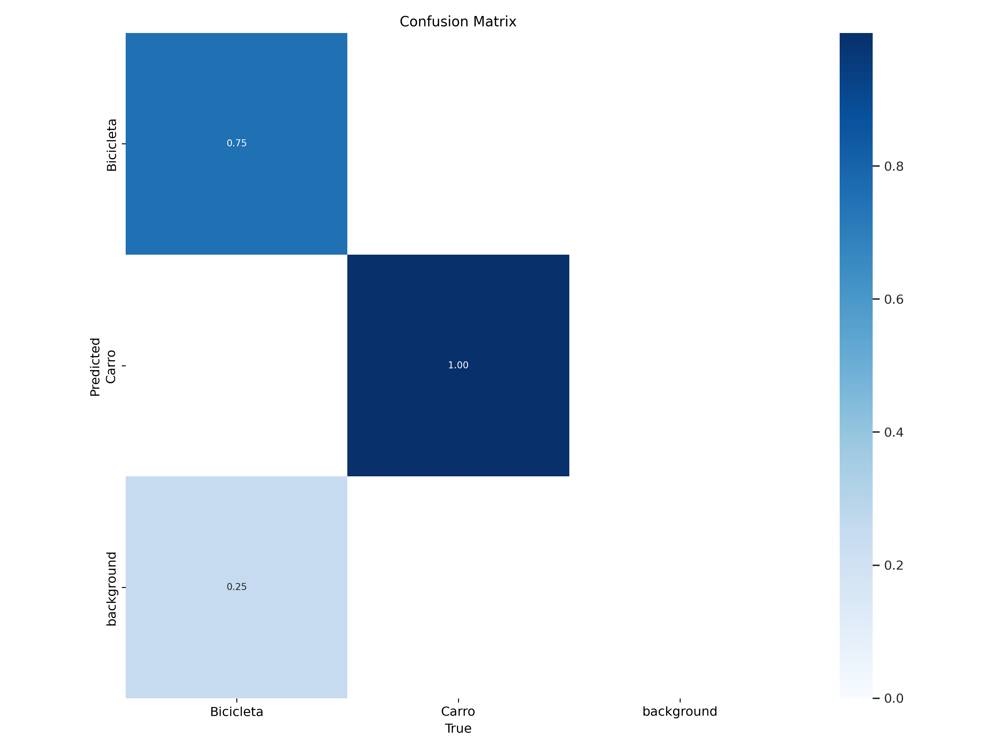

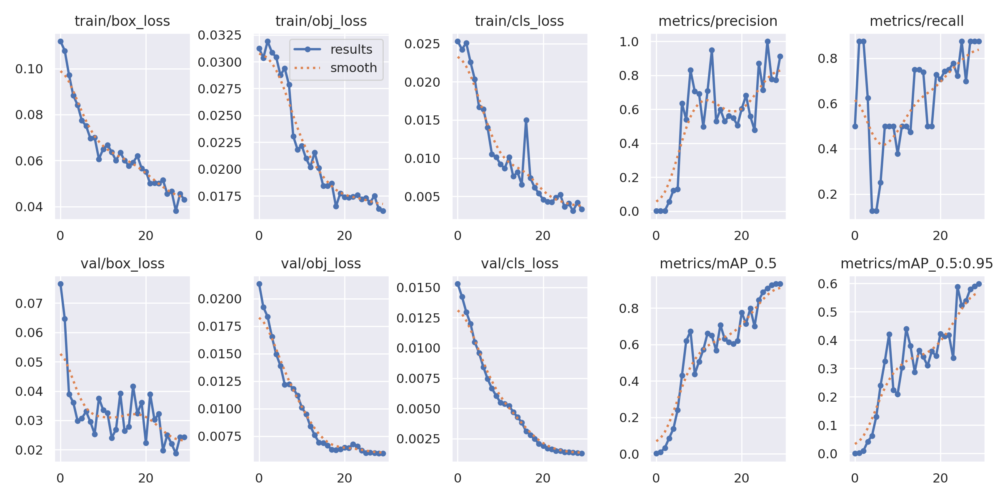

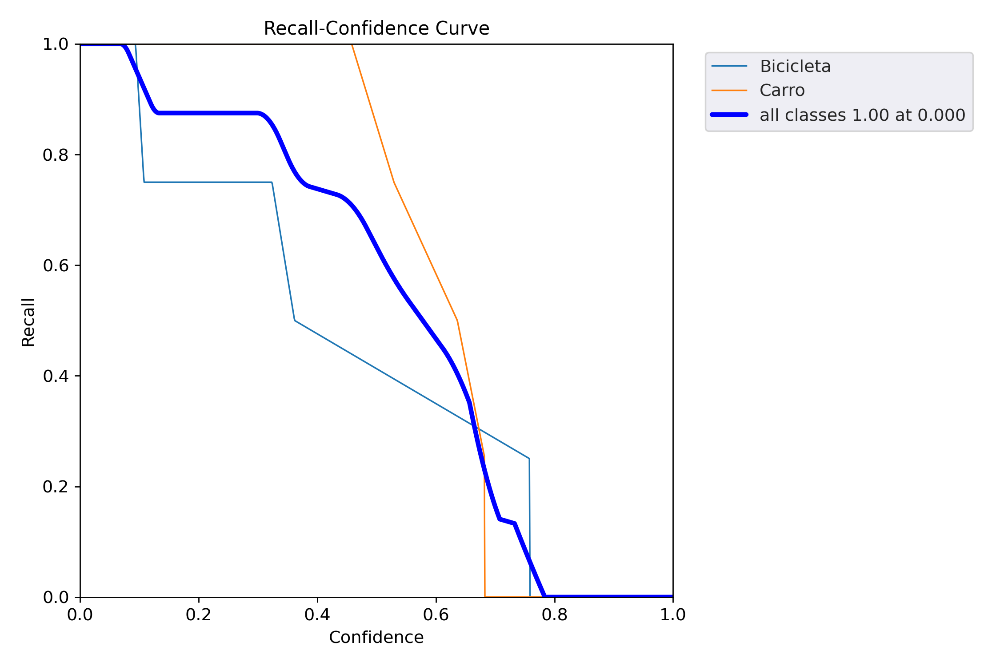

...

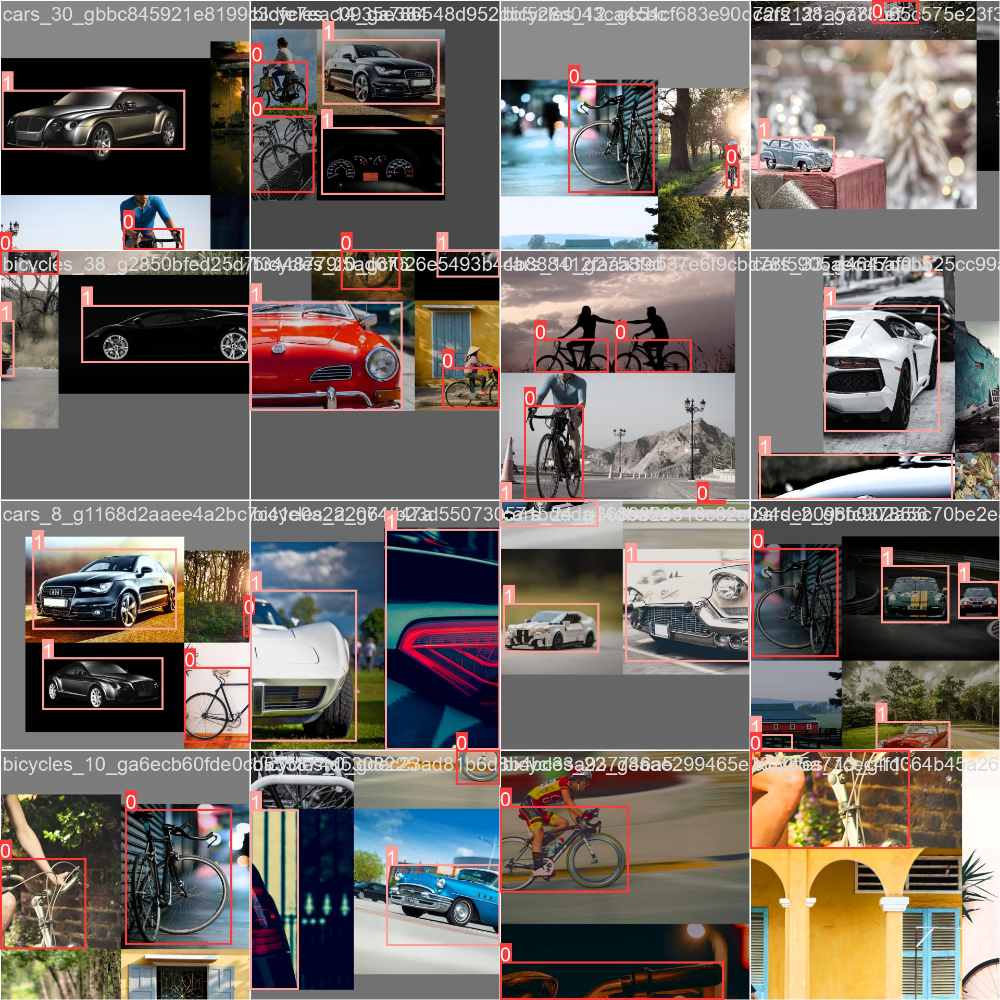

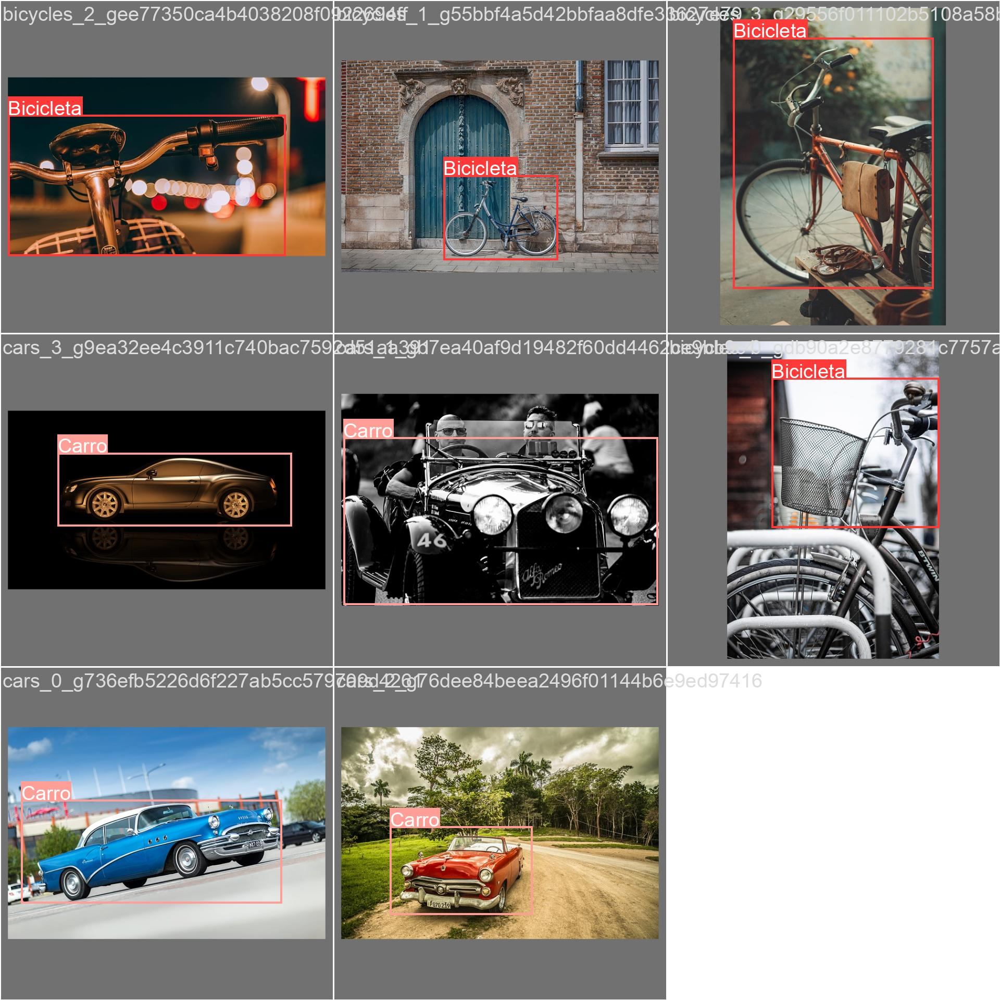

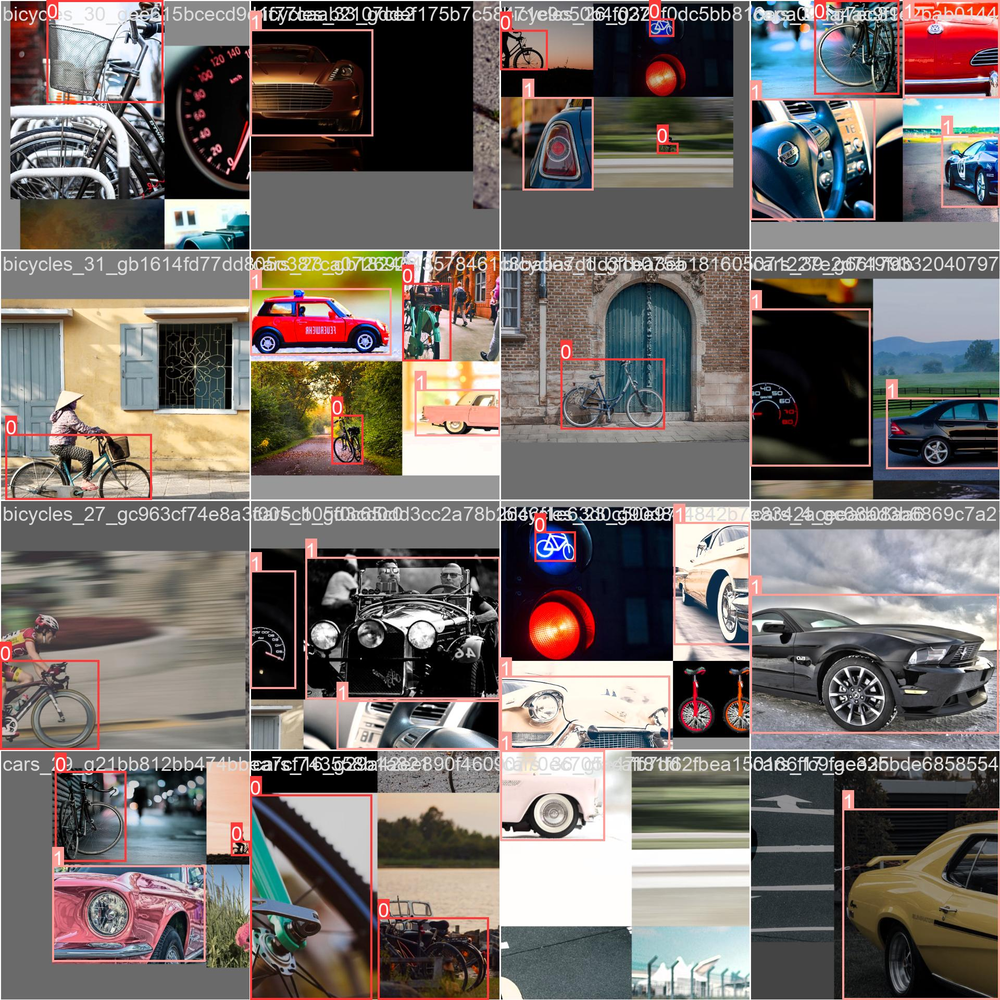

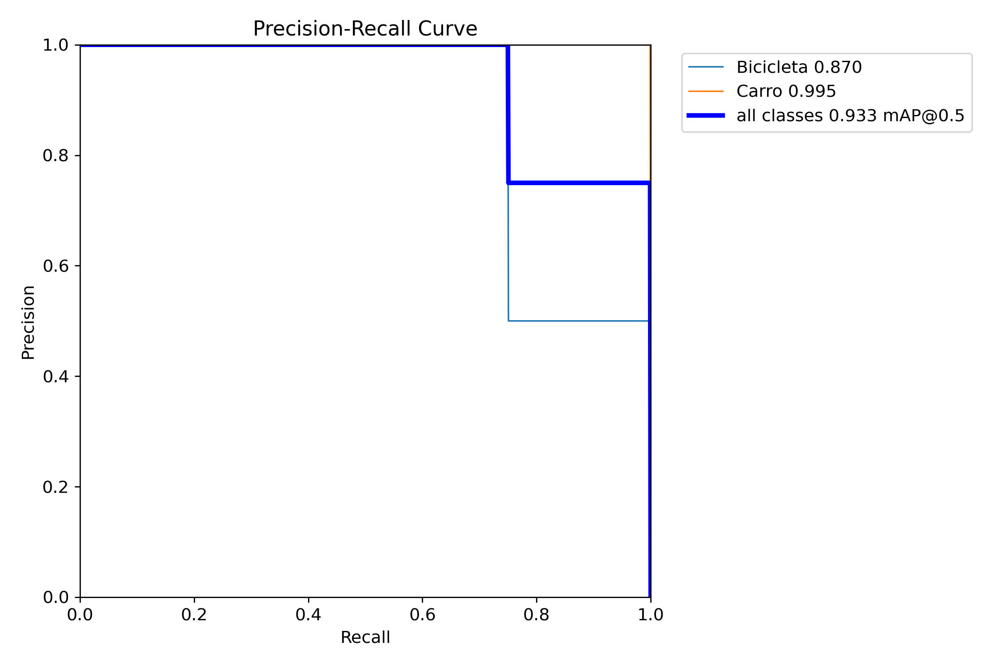

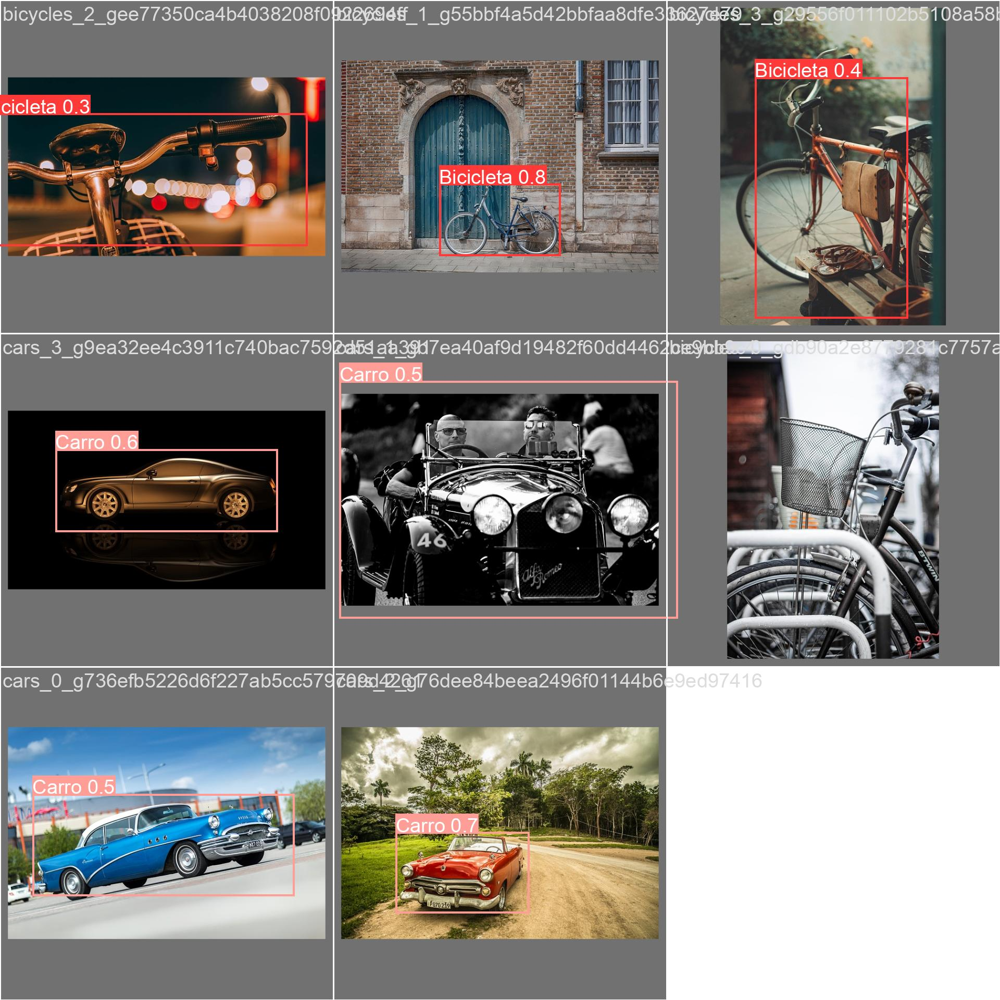

In [ ]:
# Vamos apresentar as imagens para analisarmos
from IPython.display import Image
result = !find /content/yolov5/runs/train/exp/ -type f \( -iname "*.png" -o -iname "*.jpg" \)
for file in result:

  display(Image(file))



# Analise dos dados com 30 epocas

# Perdas (Losses):

**train/box_loss, train/obj_loss, train/cls_loss:** Observamos uma tendência de queda significativa nas perdas durante as primeiras 20 épocas de treinamento. Após esse ponto, a diminuição das perdas torna-se mais gradual, sugerindo que o modelo está aprendendo e convergindo.
A linha pontilhada indica uma média móvel, suavizando as flutuações e tornando a tendência geral mais clara.

**val/box_loss, val/obj_loss, val/cls_loss:** As perdas de validação também mostram uma diminuição inicial, o que é um bom sinal de que o modelo está generalizando bem para dados não vistos durante o treinamento. No entanto, é crucial observar se as perdas de validação começam a aumentar em algum momento, *o que indicaria overfitting* (o modelo se ajustando demais aos dados de treinamento e perdendo a capacidade de generalizar). Na imagem, parece que as perdas de validação estão se estabilizando, o que é positivo.

# Precisão e Recall (Treinamento):

**metrics/precision:** A precisão aumenta rapidamente nas primeiras épocas e depois se estabiliza em um nível relativamente alto. A precisão mede a proporção de detecções positivas que estavam corretas.

**metrics/recall:** O recall também aumenta ao longo do treinamento, indicando que o modelo está se tornando melhor em encontrar todos os objetos relevantes. O recall mede a proporção de objetos positivos reais que foram detectados corretamente.

# mAP (Validação):

**metrics/mAP_0.5:** O mAP com IoU 0.5 mostra um aumento constante e significativo, atingindo um valor alto próximo ao final do treinamento. Isso indica que o modelo está se tornando cada vez melhor em localizar e classificar os objetos corretamente.
Um IoU de 0.5 significa que a caixa delimitadora prevista deve ter pelo menos 50% de sobreposição com a caixa delimitadora real para ser considerada uma detecção correta.

**metrics/mAP_0.5:0.95:** O mAP com IoU variando de 0.5 a 0.95 também mostra uma tendência crescente, embora os valores sejam ligeiramente inferiores aos do mAP_0.5. Esta métrica é mais rigorosa, pois exige uma maior sobreposição entre as caixas delimitadoras para considerar uma detecção como correta.

# Conclusão geral com 30 epocas

Com base na análise dos gráficos, o treinamento do modelo YOLO com 30 épocas foi bem-sucedido. O modelo demonstrou uma boa capacidade de aprendizado, com perdas decrescentes e métricas de desempenho crescentes. Não há evidências de overfitting, e o modelo parece estar pronto para ser avaliado nos dados de teste. No entanto, será interessante comparar esses resultados com os obtidos no treinamento com 60 épocas para determinar se o aumento no número de épocas resulta em melhorias adicionais no desempenho.

# Treinando o modelo por mais tempo
Para entendermos o potencial do sistema, vamos aumentar os ciclos de treinamentos de 30 para 60 e comparar os dois resultados.
Lembrando que o treinamento deve ser feito com uma base de dados grande, quanto maior os exemplos rotulados, melhor será a acuracia do algoritimo.

## Treinando o modelo com 60 ciclos (ou épocas)


In [ ]:
# Executa o yolo com os dados de treinamentos vamos usar 60 epocas
!python yolov5/train.py --data objects.yaml --weights yolov5s.pt --img 640 --epochs 60

wandb: WARNING ⚠️ wandb is deprecated and will be removed in a future release. See supported integrations at https://github.com/ultralytics/yolov5#integrations.
2025-04-21 13:56:00.495977: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1745243760.519887    4253 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1745243760.526504    4253 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
wandb: Using wandb-core as the SDK backend.  Please refer to https://wandb.me/wandb-core for more information.
wandb: (1) Create a W&B account
wandb: (2) Use an existing W&B account
wandb: (3) Don't visualize my results
wandb: Enter your choice: (30 second timeout) 
wandb: W&

# Mostrando os resultados

vamos coletar os resultados para iniciarmos as analises:


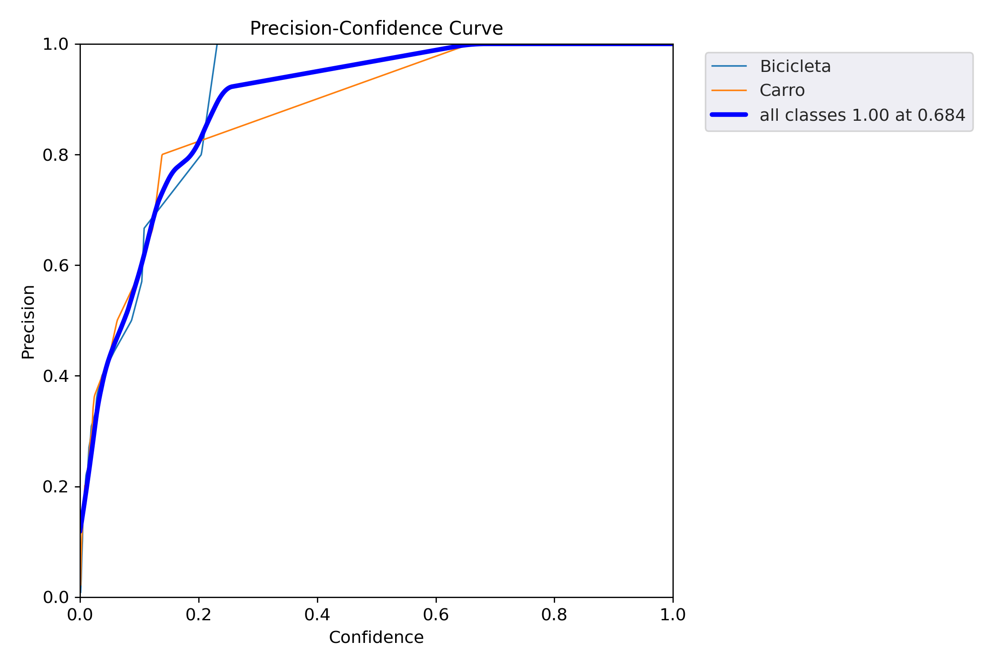

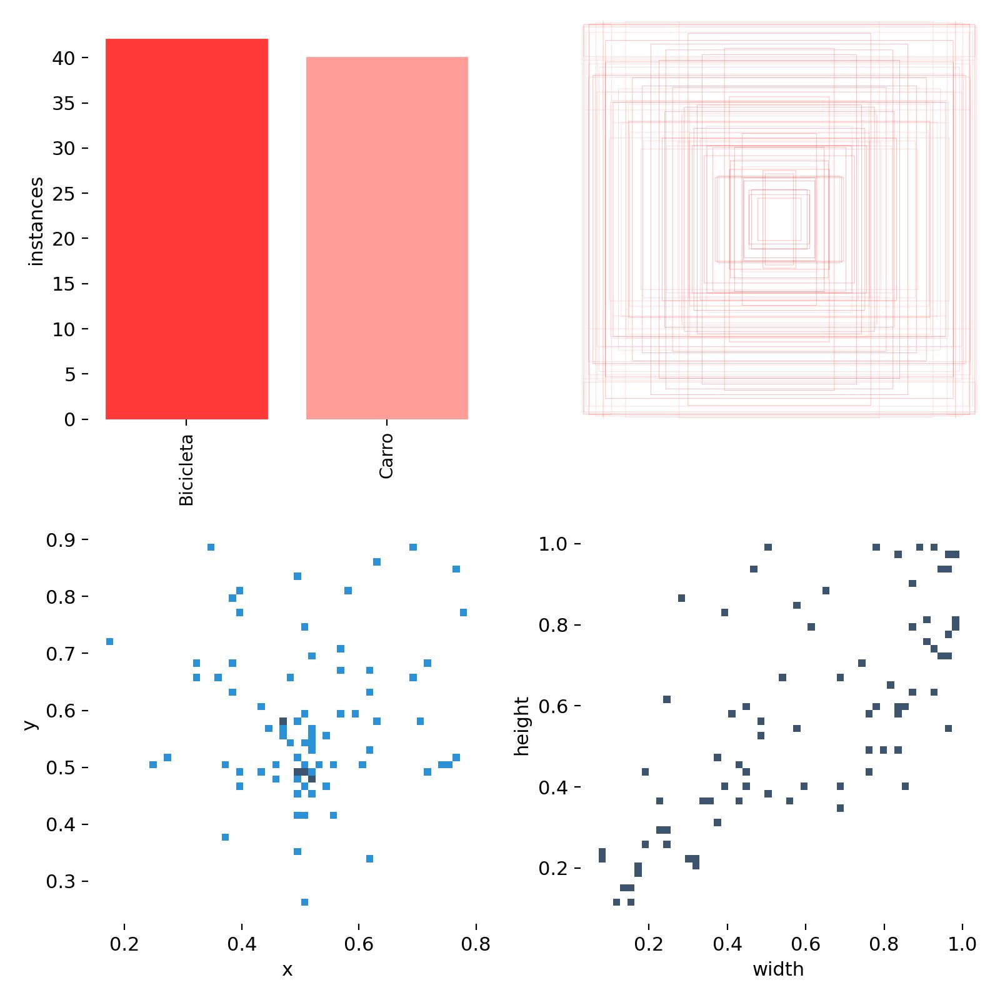

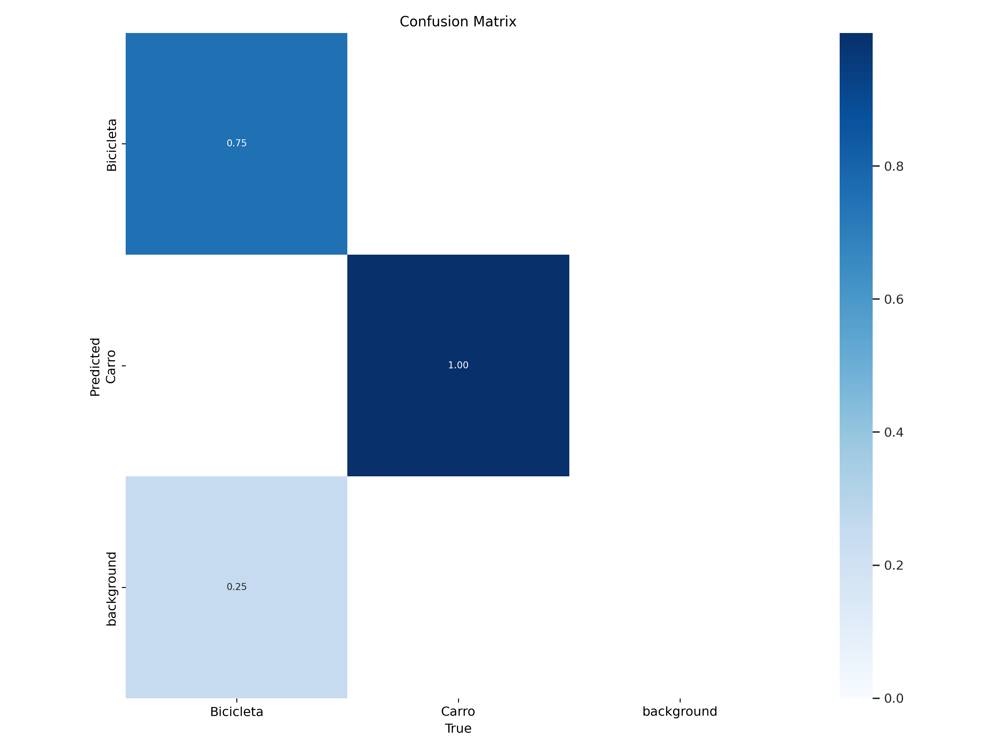

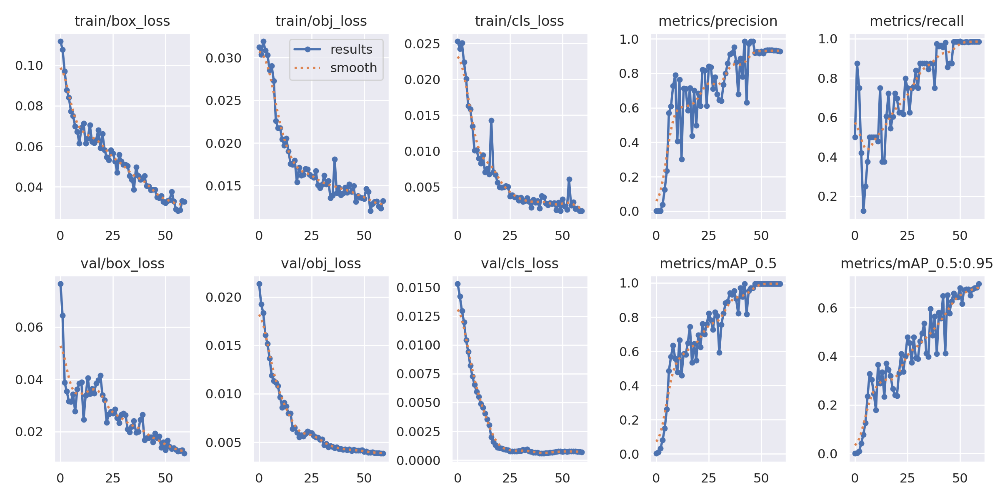

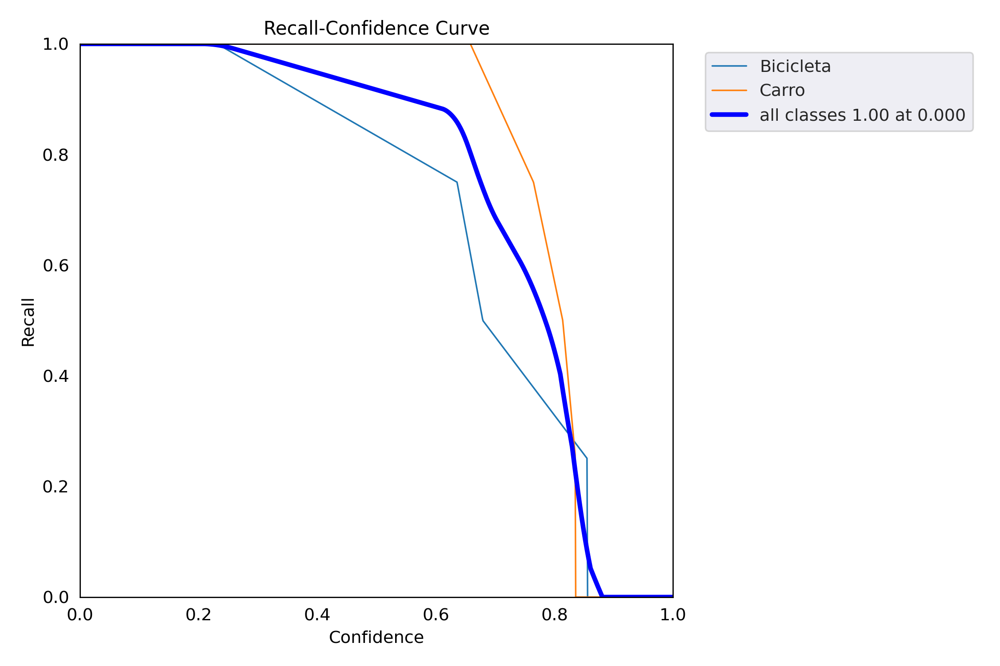

...

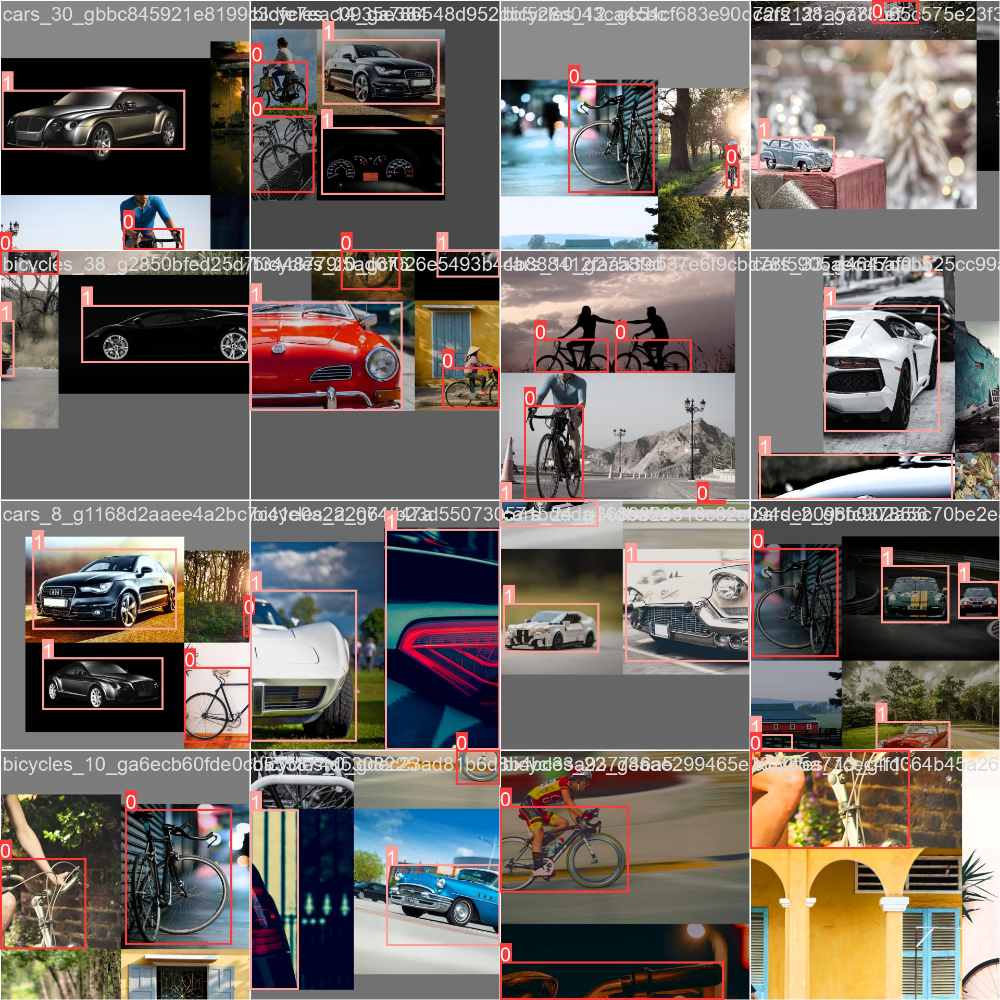

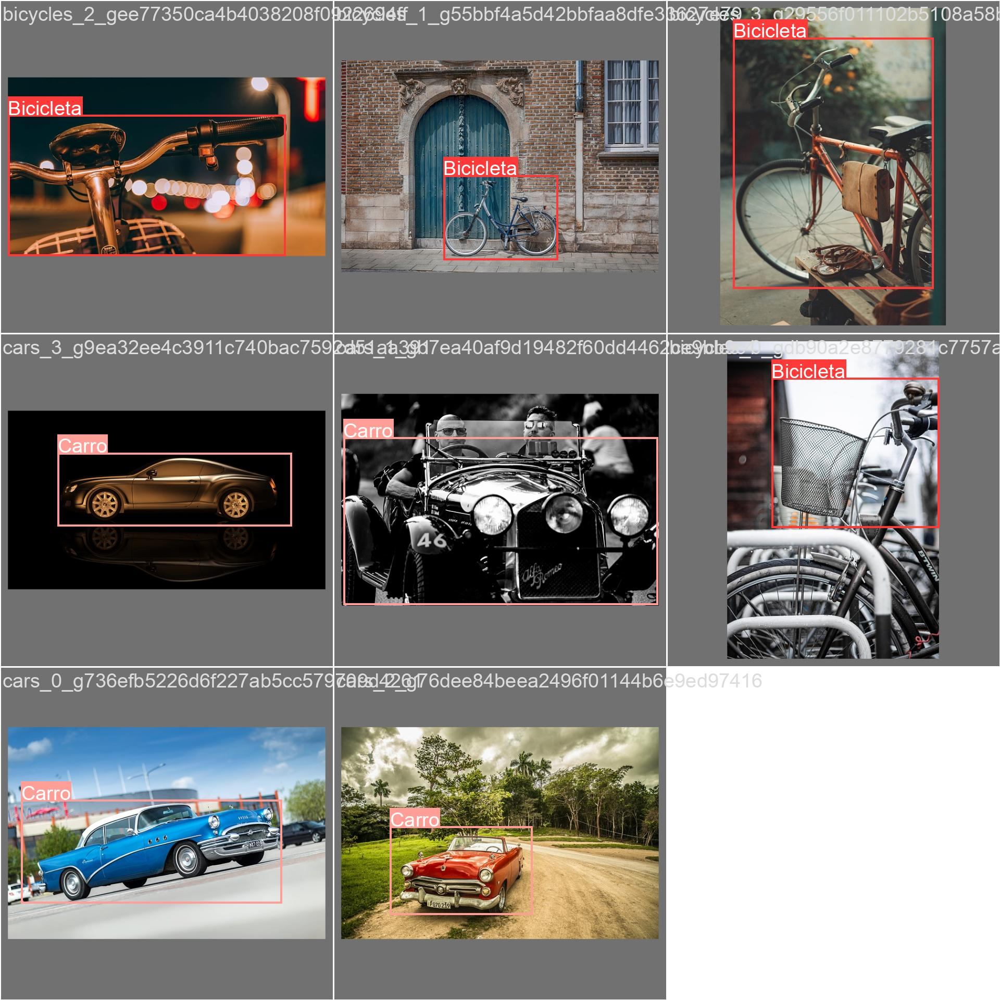

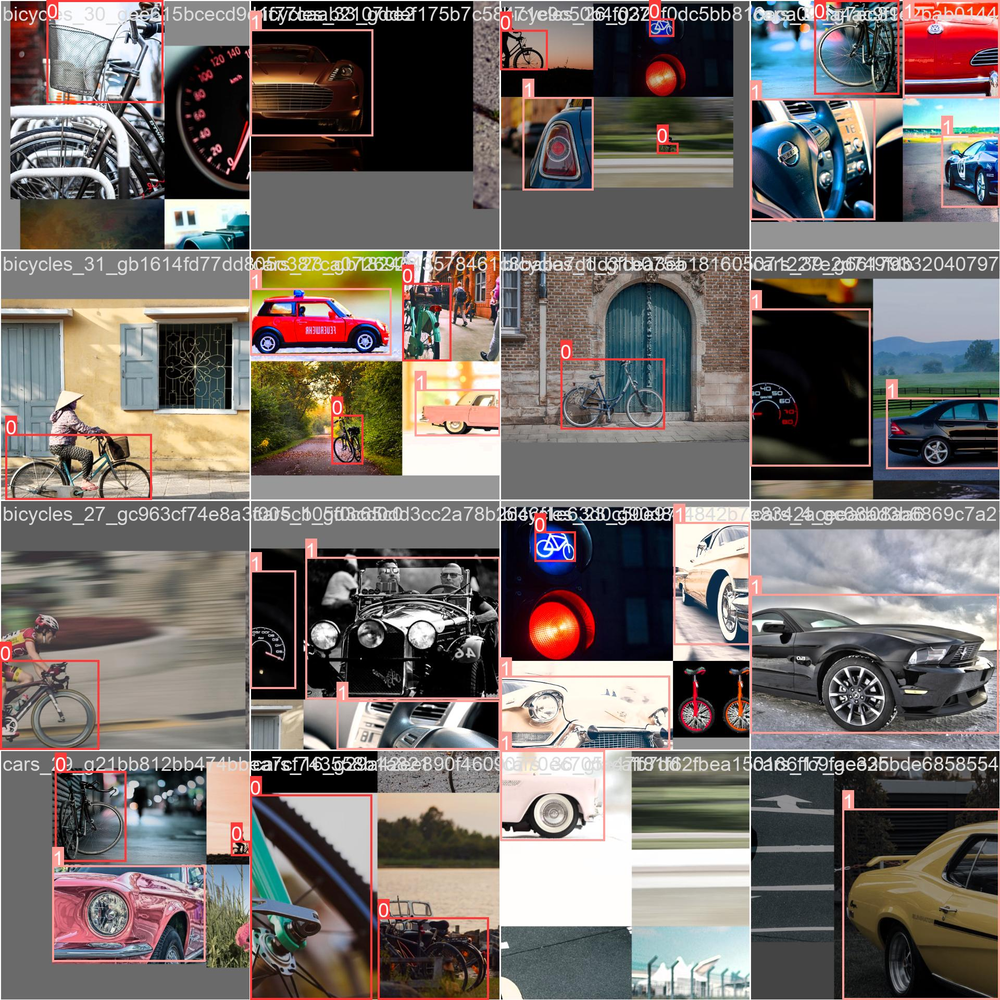

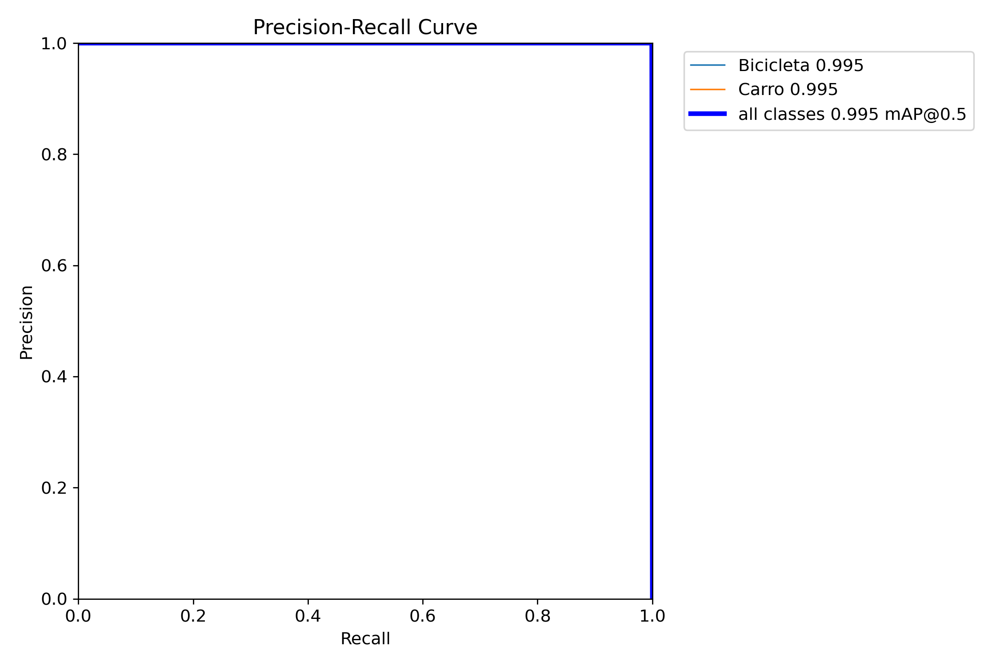

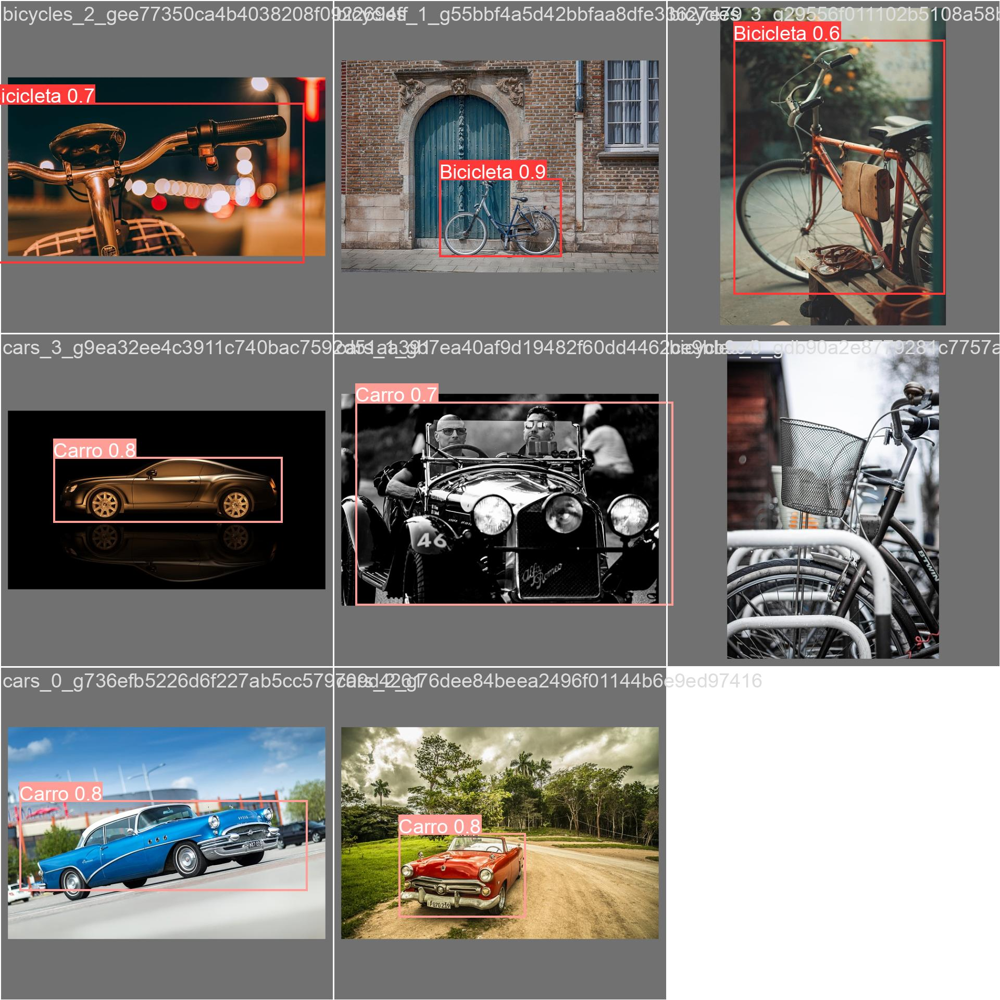

In [ ]:
# Vamos apresentar as imagens para analisarmos
from IPython.display import Image
result = !find /content/yolov5/runs/train/exp2/ -type f \( -iname "*.png" -o -iname "*.jpg" \)
for file in result:

  display(Image(file))



# Comparação de desempenho entre os ciclos

Comparando os resultados do treinamento com 30 e 60 épocas, observamos que o treinamento com 60 épocas geralmente leva a um desempenho ligeiramente melhor. As perdas são menores, e as métricas de precisão, recall e mAP são mais altas. Isso sugere que o modelo continua a aprender e melhorar seu desempenho além da 30ª época.

No entanto, a melhoria entre 30 e 60 épocas pode não ser drasticamente significativa. Se os recursos computacionais forem limitados, o treinamento com 30 épocas pode fornecer um bom equilíbrio entre desempenho e tempo de treinamento.

É importante notar que aumentar o número de épocas além de um certo ponto pode levar ao overfitting, onde o modelo se ajusta demais aos dados de treinamento e perde a capacidade de generalizar para novos dados. No entanto, com base nas imagens fornecidas, não há sinais claros de overfitting mesmo após 60 épocas.

[Notebook da entrega 2] ()